<a href="https://colab.research.google.com/github/YassineZAIBI/tensorflow-2.0/blob/master/Poc_Speaker_Diarization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Introduction to speaker Diarization, In this colab we will try to use two different libraries of speaker diarization **spectralcluster** tensorflow based library developed by google collaborators, and **pyannote. audio** library developed by French searchers for audio treatment use cases based on pytorch. 

https://pypi.org/project/spectralcluster/

https://github.com/pyannote/pyannote-audio

**Installinging the required libraries for part 1: Spectralcluster**

In [1]:
!pip install  resemblyzer
!pip install pathlib
!pip install spectralcluster
!pip install IPython
!pip install matplotlib
!pip install numpy
!pip install librosa


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 15.7 MB 11.8 MB/s 
     |████████████████████████████████| 66 kB 5.0 MB/s 
     |████████████████████████████████| 78 kB 7.7 MB/s 
  Created wheel for webrtcvad: filename=webrtcvad-2.0.10-cp37-cp37m-linux_x86_64.whl size=72403 sha256=ad6bb0a3158d508f865820ee380df4c00c70776331b695f0187ef9d3eb3f59b7
  Stored in directory: /root/.cache/pip/wheels/11/f9/67/a3158d131f57e1c0a7d8d966a707d4a2fb27567a4fe47723ad
  Created wheel for typing: filename=typing-3.7.4.3-py3-none-any.whl size=26325 sha256=b5bd5187c9fa35790343987dabaef3d4ab14004421b17b7990b7745d64cf85ba
  Stored in directory: /root/.cache/pip/wheels/35/f3/15/01aa6571f0a72ee6ae7b827c1491c37a1f72d686fd22b43b0e
Successfully built webrtcvad typing


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


**Introducing our audio**

In [2]:
from resemblyzer import preprocess_wav, VoiceEncoder
from pathlib import Path
from spectralcluster import SpectralClusterer
import google.colab
import IPython
import matplotlib.pyplot as plt
import numpy as np
import librosa
from resemblyzer import preprocess_wav, VoiceEncoder
from resemblyzer.hparams import sampling_rate
from time import sleep, perf_counter as timer
audio_file, _ = google.colab.files.upload().popitem()

Saving Clash.wav to Clash.wav


**Graphic and audio introduced presentation**

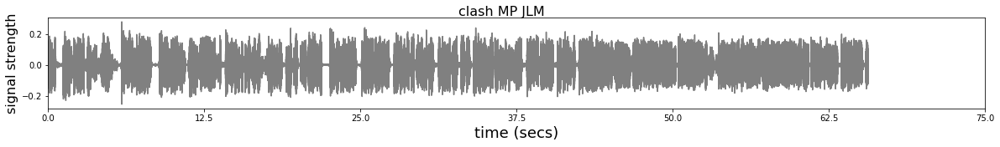

In [3]:
sr = 16000
signal, sr = librosa.load(audio_file,sr=sr) 

fig,ax = plt.subplots(1,1)
fig.set_figwidth(20)
fig.set_figheight(2)
plt.plot(np.arange(len(signal)),signal,'gray')
fig.suptitle('clash MP JLM', fontsize=16)
plt.xlabel('time (secs)', fontsize=18)
ax.margins(x=0)
plt.ylabel('signal strength', fontsize=16);
a,_ = plt.xticks();plt.xticks(a,a/sr);

IPython.display.Audio(audio_file)

**Test with Resemblyzer library**

In [4]:
wav = preprocess_wav(audio_file)
encoder = VoiceEncoder("cpu")
_, cont_embeds, wav_splits = encoder.embed_utterance(wav, return_partials=True, rate=16)
print(cont_embeds.shape)

Loaded the voice encoder model on cpu in 0.01 seconds.
(1044, 256)


In [6]:
clusterer = SpectralClusterer(
    min_clusters=2,
    max_clusters=7,
    autotune=None,
    laplacian_type=None,
    refinement_options=None,
    custom_dist="cosine")

**Get Label for each segment**

In [7]:
labels = clusterer.predict(cont_embeds)


In [8]:
def create_labelling(labels,wav_splits):
    from resemblyzer.audio import sampling_rate
    times = [((s.start + s.stop) / 2) / sampling_rate for s in wav_splits]
    labelling = []
    start_time = 0

    for i,time in enumerate(times):
        if i>0 and labels[i]!=labels[i-1]:
            temp = [str(labels[i-1]),start_time,time]
            labelling.append(tuple(temp))
            start_time = time
        if i==len(times)-1:
            temp = [str(labels[i]),start_time,time]
            labelling.append(tuple(temp))

    return labelling

In [9]:
labelling = create_labelling(labels,wav_splits)


In [10]:
labelling

[('0', 0, 1.76),
 ('1', 1.76, 6.68),
 ('0', 6.68, 6.74),
 ('1', 6.74, 6.86),
 ('0', 6.86, 9.02),
 ('1', 9.02, 9.08),
 ('0', 9.08, 9.14),
 ('1', 9.14, 9.38),
 ('0', 9.38, 9.44),
 ('1', 9.44, 9.56),
 ('0', 9.56, 9.8),
 ('1', 9.8, 20.0),
 ('0', 20.0, 21.56),
 ('1', 21.56, 24.08),
 ('0', 24.08, 24.14),
 ('1', 24.14, 24.38),
 ('0', 24.38, 24.56),
 ('1', 24.56, 24.74),
 ('0', 24.74, 25.64),
 ('1', 25.64, 32.54),
 ('0', 32.54, 33.5),
 ('1', 33.5, 41.6),
 ('0', 41.6, 41.66),
 ('1', 41.66, 41.72),
 ('0', 41.72, 53.36),
 ('1', 53.36, 56.66),
 ('0', 56.66, 63.38)]

**Installinging the required libraries for part 2: Pyannote**

In [25]:
!pip install git+git://github.com/pytorch/audio
!pip install https://github.com/pyannote/pyannote-audio/archive/develop.zip

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning git://github.com/pytorch/audio to /tmp/pip-req-build-57ew85tv
  Running command git clone -q git://github.com/pytorch/audio /tmp/pip-req-build-57ew85tv
  fatal: unable to connect to github.com:
  github.com[0: 140.82.121.4]: errno=Connection timed out

ERROR: Command errored out with exit status 128: git clone -q git://github.com/pytorch/audio /tmp/pip-req-build-57ew85tv Check the logs for full command output.
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached https://github.com/pyannote/pyannote-audio/archive/develop.zip
  Cloning https://github.com/asteroid-team/torch-audiomentations (to revision master) to /tmp/pip-install-1xzx7lft/torch-audiomentations_db01cd9a26c0427aa15c916072acdf75
  Running command git clone -q https://github.com/asteroid-team/torch-audiomentations /tmp/pip-install-1xzx7lft/torch-audiomentati

In [27]:
from pyannote.audio.pipelines import VoiceActivityDetection
pipeline = VoiceActivityDetection(segmentation="pyannote/segmentation")
HYPER_PARAMETERS = {
  # onset/offset activation thresholds
  "onset": 0.5, "offset": 0.5,
  # remove speech regions shorter than that many seconds.
  "min_duration_on": 0.0,
  # fill non-speech regions shorter than that many seconds.
  "min_duration_off": 0.0
}
pipeline.instantiate(HYPER_PARAMETERS)
vad = pipeline(audio_file)

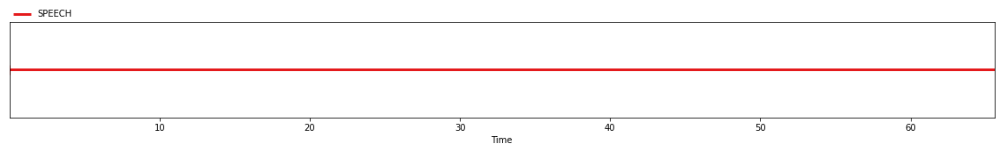

In [28]:
vad

In [29]:
from pyannote.audio.pipelines import OverlappedSpeechDetection
pipeline = OverlappedSpeechDetection(segmentation="pyannote/segmentation")
pipeline.instantiate(HYPER_PARAMETERS)
osd = pipeline(audio_file)

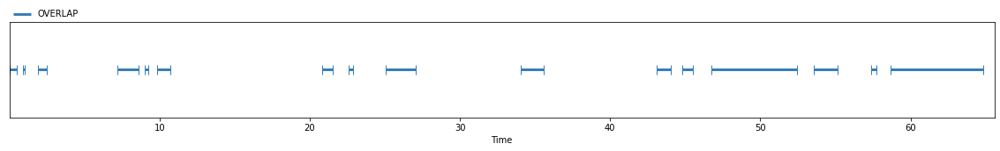

In [30]:
osd

In [40]:
from pyannote.audio.pipelines import Resegmentation
pipeline = Resegmentation(segmentation="pyannote/segmentation", 
                          diarization="baseline")
pipeline.instantiate(HYPER_PARAMETERS)
resegmented_baseline = pipeline({"audio": audio_file, "baseline": "diarization" })

AttributeError: ignored